<a href="https://colab.research.google.com/github/NAWTTY/khomol/blob/master/ML_Individual_Assessment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Machine Learning - (EDA) – Individual Project

Based on the COVID-19 - Clinical Data to Assess Diagnosis, this notebook shows the Exploratory Data Analysis (EDA), Data Preparation, and ML Model Building workflow in action. 

The actual Exploratory Data Analysis (EDA) workflow for predicting safe drivers using the PorteSeguro dataset, which is also one of the Kaggle competitions


The primary divisions of the notebook are as follows:

1. [Install particular analysis packages](#install_packages)
    * [load analysis package](#load_packages)
    * [Initial configuration of Data Path Drive/LocalData](#load_data)
    * [Data at first sight](#first_sight)
2. [EDA and Data Processing](#data)
    * [Missingno](#msno)
    * [Calculating total unique patient](#CTUP)
    * [All features](#AF)
    * [Checking data head](#CDH)
    * [Analysis of current data](#AOCD)
    * [Fill missing values](#FMV)
    * [Amount of feature](#AOF)
3. [Building ML Models ](#BML)
    * [Creating final data of target and features](#tnf)
    * [Exploratory Data Analysis (EDA)](#eda)
    * [Data Quality Issues](#data_quality) 
    * [Univariate Exploration](#univariate_exploration) 
    * [Bivariate Exploration](#bivariate_exploration) 
4. Conclusion.

# Install particular analysis packages <a name="install_packages"></a>



There are only a few plugins or tools to install for the EDA out of the many Python plugins that execute various algorithms, such as

* missingno offers the ability to comprehend the distribution of missing values.
* panda profile generates profile details needed from a pandas DataFrame for the a particular operation.
* empiricaldist which disturb the empirical function.
* factor analyzer to analyze exploratory and factor analysis (EFA).

In [1]:
!pip install openpyxl
!pip install xgboost
!pip install numpy
!pip install seaborn
!pip install missingno
!pip install scikit-learn
!pip install missingno
!pip install pandas-profiling==2.8.0
!pip install empiricaldist
!pip install factor-analyzer
!pip install natsort
!pip install imblearn
!pip install absl-py
!pip install catboost
!pip install lightgbm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in

# Load analysis tools <a name="load_packages"></a>

---

<p>All required libraries, including Sklearn and missingo to plot graphs,panda, nump, mateplotlib,seaborn are imported. Moreover, panda should be configured to display all rows and columns without trancuating.

The required analysis tools that are installed which are the specified tools use to perform the algotithms, graphs and more functions.
 
The "import" helps to convert plugins names to abbreviation, while the sklearn predict the data analysis.</p>

---

In [2]:
import math
import sys
import os.path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import metrics
import missingno as msno  # Visualize missing values
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score  
from sklearn.metrics import precision_score, recall_score, roc_auc_score
from natsort import index_natsorted
from sklearn.ensemble import VotingClassifier

# setting option to view all column and rows, no limit
pd.options.display.max_columns = None
pd.options.display.max_rows = None

### Set Up data File <a name="load_data"></a>

The data file, which includes the Covid 19 clinic file, is the project's most crucial component. We must upload the file to Mydrive on Colab. To use a Jupyter notebook, simply download the file, put it in a new folder, and run the notebook in the location where we automatically save the notebook when working on your application. Colab will locate it when uploaded, but you don't need to do this for other types of files. 

#### After setting up Google Drive, we may use the data there immediately.

In [3]:
from google.colab import drive
drive.mount('/content/drive')
# After executing the cell above, Drive
# files will be present in "/content/drive/My Drive".


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Datapath

In [4]:
!ls "/content/drive/My Drive"
%cd '/content/drive/My Drive/Colab/C19_clinicfile'

dataPath = 'C19_clinicfile.xlsx'   
print('Datset File Exists: ', os.path.isfile(dataPath))

 0002-41155457976.png
'20220907 bpm 124 fwmnene beatonly.mp3'
'20220926 bpm84 센쥬하시라마타입비트.mp3'
'20220926 bpm99 빌공 사이간.mp3'
'20220928 bpm114 섹스하고싶다 (1).mp3'
'20220928 bpm114 섹스하고싶다.mp3'
'20221005 1초노이지아하고설레서봣지만윽저리가.mp3'
'20221006 bpm99 눈앞에나타나지마베이베.mp3'
'20221006 vox bpm85 뒤지게보컬체인이랑놀기.mp3'
'20221014 bpm81 듬직한털난등빨.mp3'
 ABRAHAM_KOMOLAFE_CV.docx
 ABRAHAM_KOMOLAFE_CV.pdf
 ABRAHAM_KOMOLAFE_CV.txt
'ALL OVER U (1).zip'
'ALL OVER U.zip'
 BLESSED.wav
 C19_clinicfile.xlsx
 CAS-E4G3MX5I44F0Q1-Komolafe.gdoc
 CAS-E4G3MX5I44F0Q1-Komolafe.pdf
'Colab Notebooks'
'Contact Information.gform'
'Contact Information (Responses).gsheet'
 Critique.docx
 Critique.gdoc
'customTF 2'
'Extension Form 2021-22-1.docx'
'Extension Form 2021-22.docx'
'Extension Form 2021-22.gdoc'
'Getting started.pdf'
'https: youtube.com shorts juB9MuYBH7w?feature=share.txt'
'New folder (1).zip'
'New folder.zip'
 Outlook
'Project proposal.gd

#### Setup File Path Locally..

The suggested technique is to declare your data path in a dataPath Variable.


### Declaring your data path in a dataPath Variable is the advised method.

In [5]:
dataPath = "https://docs.google.com/spreadsheets/d/1x81dejmo7iGblb-s9cSgwZ9FBAAVrvco/edit?usp=sharing&ouid=108858435085810058462&rtpof=true&sd=true"
dataPath = 'https://drive.google.com/uc?export=download&id='+dataPath.split('/')[-2]

# Loading Data


Loading data which are the train and test files that are uploaded to colab drive or Mydrive.

Here we can fetch the dataset and also read the information of individual listed on file This files are sorted using panda to call up the csv files.

In [6]:
data = pd.read_excel('/content/drive/MyDrive/C19_clinicfile.xlsx')


Recognisation of first and last dataset.

Three things to be noted

* Elements that are marked with feature names pertain to comparable categories (i.e.; ind, reg, car, calc).

* While feature names with the postfix "bin" or "cat" to denote binary or categorical characteristics respectively, unique features are also continuous or ordinal without these designations. this is just to identify the main features.

* With values of -1 signifying that the feature was absent from the observation and the target columns designating whether or not a claim was made for that policy holder.

In order to understand binary variables, categorical variables with integer category values, other variables with integer or float values, and variables with -1 denoting missing data, we must first grasp these four types of variables.

*The first five rows of the datasets are reviewed using train.head()

*While the last five rows of the datasets are reviewed using train.tail()

*This provides first five rows and all columns

*To get the info using train.info(). The data set does not contain any null values. That is typical because -1 is used in place of missing values. <a name='eda'></a>


# Data at first sight <a name='first_sight'></a>

Here is an excerpt of the the data description for the data:

 * Patient demographic information (03)
 * Patient previous grouped diseases (09)
 * Blood results (36)
 * Vital signs (06)
 
 ICU should be considered, as the first version of this data, the target 
 variable.

Three things to be noted

* Elements that are marked with feature names pertain to comparable categories (i.e.; ind, reg, car, calc).

* While feature names with the postfix "bin" or "cat" to denote binary or categorical characteristics respectively, unique features are also continuous or ordinal without these designations. this is just to identify the main features.

* With values of -1 signifying that the feature was absent from the observation and the target columns designating whether or not a claim was made for that policy holder.

In order to initialize binary variables, categorical variables with integer category values, other variables with integer or float values, and variables with -1 denoting missing data, we must first grasp these four types of variables.

*The first five rows of the datasets are reviewed using train.head()

*While the last five rows of the datasets are reviewed using train.tail()

*This provides first five rows and all columns

*To get the info using train.info(). The data set does not contain any null values. That is typical because -1 is used in place of missing values. <a name='eda'></a>


Ok, that's important information to get us started. Let's have a quick look at the first and last rows to confirm all of this.

---

<p>There are five rows of data for each patient to display in the Window, per the instructions. </p>

---

In [14]:
data.head()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [15]:
data.tail()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
1920,384,0,50th,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

---

<p>Print the data info. </p>

---

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1925 entries, 0 to 1924
Columns: 231 entries, PATIENT_VISIT_IDENTIFIER to ICU
dtypes: float64(225), int64(4), object(2)
memory usage: 3.4+ MB


Note:
* By using the info() method, we can determine the data type to be float, int, and object (2)

---
To check the rows and cols , print() will print out the amount of dataset included in train and test. This will show every dataset including the non value. <a name='eda'></a>


In [17]:
print("data (rows, cols):",data.shape)

data (rows, cols): (1925, 231)


---

#### Panda profile
---

---

As the data is now much more cleaned, we will run Panda Profiling analysis.

Note: 

* The installation of panda profile might have issue like not running the profile_data_df = pdp.ProfileReport to fetch the profile of the dataset.

* To fix this you need to change the ABCIndexClass to ABCIndex in boolean.py file.

---

In [18]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [19]:
from pandas_profiling import ProfileReport


In [20]:
import pandas_profiling as pdp

In [21]:
profile_data_df = pdp.ProfileReport(data, 
                                     minimal = True, 
                                     # Deals with large datasets
                                     explorative=True, 
                                     # includes many features for text 
                                     title = 'ProfilingResults',
                                     progress_bar=True)

In [22]:
profile_data_df

Summarize dataset:   0%|          | 0/240 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Observation:

It seems like all the disease groupings are highly imbalanced here. So before we truncate this, let's find out right now how many feature groups such as Comorbodies, Demographics are remaining.

#EDA And Data Processing <a name="data"></a>

----
### Missingno <a name="MSNO"></a>
To display the missing values, we can use the missingno package. In order to accomplish that, we must first convert the -1 values into NAN values before using missingno.

---



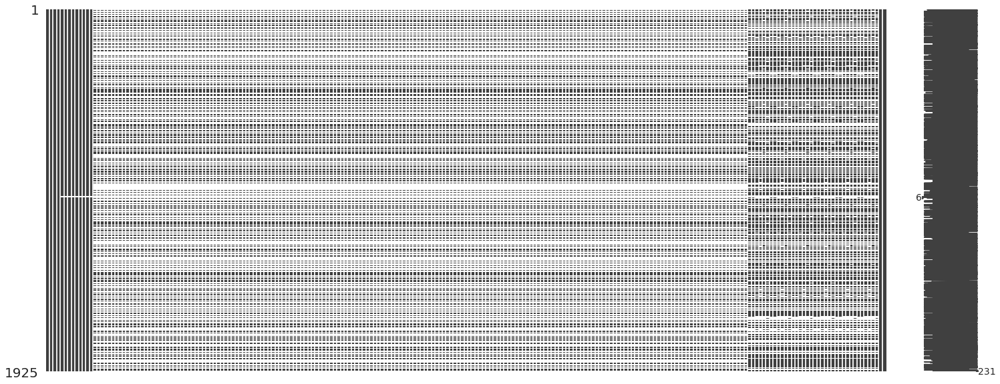

In [23]:
import missingno as msno  # Visualize missing values
%matplotlib inline
msno.matrix(data)

Note: Using the missingno bar to print out a horizontal histogram chart showing the shortest and longest missing value.

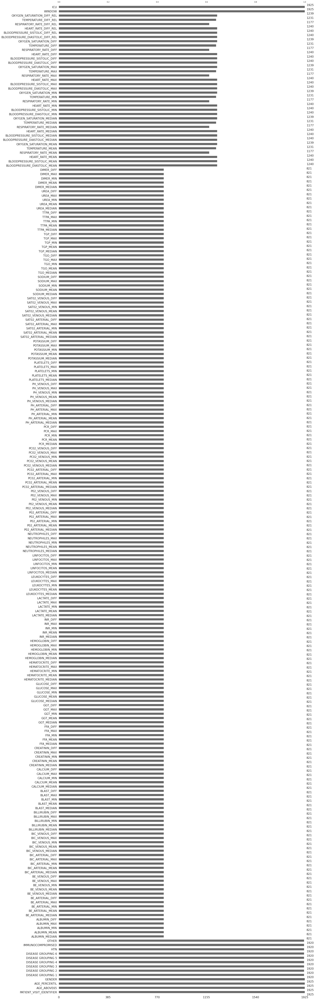

In [24]:
msno.bar(data);

NOTE: There are a lot of records in the tables with missing values. delete the value. We can leave the missing value of -1 as is for the other categorical variables that have missing values. almost 98% of the records in (real/interval) had missing values.  

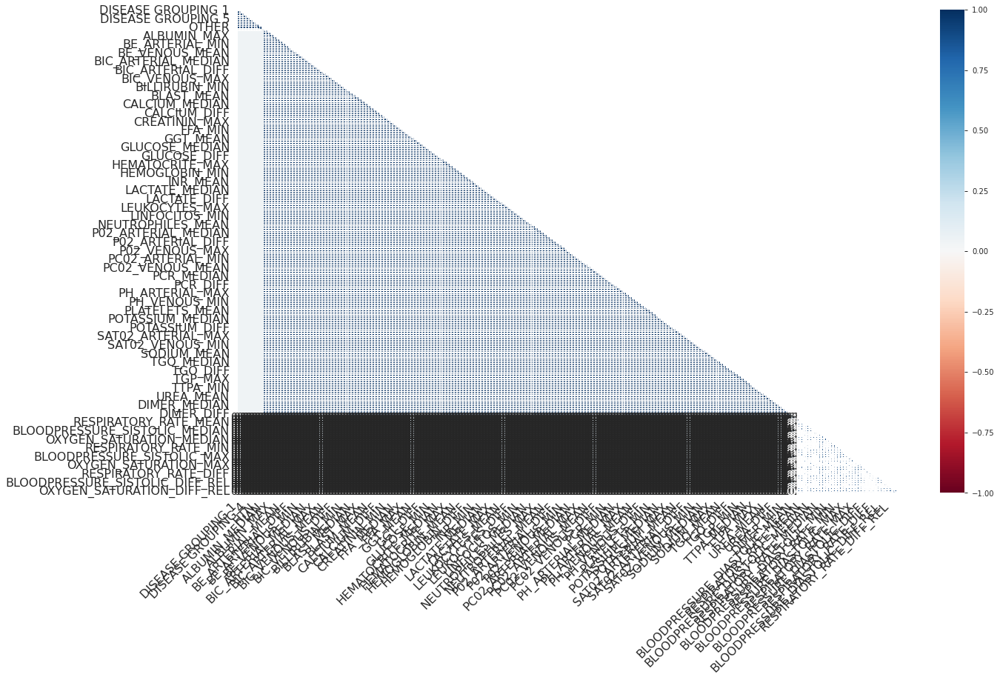

In [25]:
msno.heatmap(data)


----
Note: When missing values are present in one variable but not in another, negative associations may point to imputational opportunities.

----

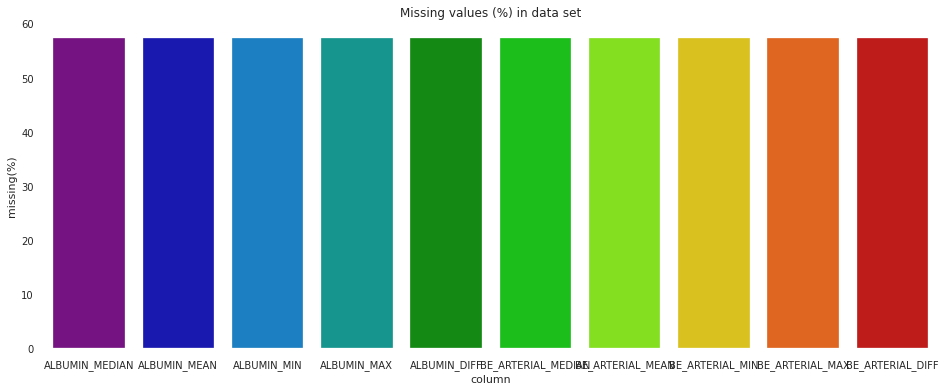

In [26]:
df_missing_data = pd.DataFrame({'column':data.columns, 'missing(%)':((data.isna()).sum()/data.shape[0])*100})
df_missing_data_nl = df_missing_data.nlargest(10, 'missing(%)')
sns.set_palette(sns.color_palette('nipy_spectral'))

plt.figure(figsize=(16,6))
sns.barplot(data= df_missing_data_nl, x='column', y='missing(%)',palette='nipy_spectral')
plt.title('Missing values (%) in data set')
plt.show()

### Calculating total unique patient<a name="CTUP"></a>

In [27]:
#total number of patients. As Id are ordered so we get the Max ID number 
print(f"The total number of patients from the data is {data['PATIENT_VISIT_IDENTIFIER'].max()+1}")

The total number of patients from the data is 385


### All features<a name="AF"></a>

In [28]:
data.columns.values

array(['PATIENT_VISIT_IDENTIFIER', 'AGE_ABOVE65', 'AGE_PERCENTIL',
       'GENDER', 'DISEASE GROUPING 1', 'DISEASE GROUPING 2',
       'DISEASE GROUPING 3', 'DISEASE GROUPING 4', 'DISEASE GROUPING 5',
       'DISEASE GROUPING 6', 'HTN', 'IMMUNOCOMPROMISED', 'OTHER',
       'ALBUMIN_MEDIAN', 'ALBUMIN_MEAN', 'ALBUMIN_MIN', 'ALBUMIN_MAX',
       'ALBUMIN_DIFF', 'BE_ARTERIAL_MEDIAN', 'BE_ARTERIAL_MEAN',
       'BE_ARTERIAL_MIN', 'BE_ARTERIAL_MAX', 'BE_ARTERIAL_DIFF',
       'BE_VENOUS_MEDIAN', 'BE_VENOUS_MEAN', 'BE_VENOUS_MIN',
       'BE_VENOUS_MAX', 'BE_VENOUS_DIFF', 'BIC_ARTERIAL_MEDIAN',
       'BIC_ARTERIAL_MEAN', 'BIC_ARTERIAL_MIN', 'BIC_ARTERIAL_MAX',
       'BIC_ARTERIAL_DIFF', 'BIC_VENOUS_MEDIAN', 'BIC_VENOUS_MEAN',
       'BIC_VENOUS_MIN', 'BIC_VENOUS_MAX', 'BIC_VENOUS_DIFF',
       'BILLIRUBIN_MEDIAN', 'BILLIRUBIN_MEAN', 'BILLIRUBIN_MIN',
       'BILLIRUBIN_MAX', 'BILLIRUBIN_DIFF', 'BLAST_MEDIAN', 'BLAST_MEAN',
       'BLAST_MIN', 'BLAST_MAX', 'BLAST_DIFF', 'CALCIUM_MEDIAN',
   

---
There are 4 groups of features:
* **Comorbities**  ($N^{\underline{o}}: 9$)
   The Charlson and Elixhauser range of comorbid diseases was used to build the characteristics based on the history ICD-10 codes of each patient. The comorbid groups linked to major unfavourable outcomes in COVID-19 have been selected in this instance.

1. **Demographics** ($N^{\underline{o}}: 3$)
   Percentil Age, Above 65 years old and Gender.

2. **Vital Signs**  ($N^{\underline{o}}: 36$) 
   Heart rate, systolic blood pressure, respiratory rate, temperature, and diastolic blood pressure.
Saturation of oxygen.

3. **Laboratory**   ($N^{\underline{o}}: 180$)
  There are 36 laboratorys types.

Note: ICU admission is the outcome variable.

---


In [29]:
comorb_lst = [i for i in data.columns if "DISEASE" in i]
comorb_lst.extend(["HTN", "IMMUNOCOMPROMISED", "OTHER"])

demo_lst = [i for i in data.columns if "AGE_" in i]
demo_lst.append("GENDER")

vitalSigns_lst = data.iloc[:,193:-2].columns.tolist()

lab_lst = data.iloc[:,13:193].columns.tolist()

print(f"Number of Comorbities features: {len(comorb_lst)}") 
print(f"Number of Demographics features: {len(demo_lst)}") 
print(f"Number of Vital Signs features: {len(vitalSigns_lst)}") 
print(f"Number of Laboratory features: {len(lab_lst)}") 

Number of Comorbities features: 9
Number of Demographics features: 3
Number of Vital Signs features: 36
Number of Laboratory features: 180


#### Now, looking at the detail about the data and how the window functions.

---

Starting with the admittance to the hospital, there are five time periods. 

Note: The patient's vital signs, laboratory results, and a flag indicating whether or not the patient was admitted to the ICU are all displayed in that window.

---

In [30]:
print(data.WINDOW.unique())

['0-2' '2-4' '4-6' '6-12' 'ABOVE_12']


---

showing a sample of data with the IDs 13, 14, 15, 41, 0, and 2.

1 indicates a positive value, whereas 0 indicates a negative value.
The example is provided below.

1. Twelve hours after being brought into the hospital, the ID-13 patient was transferred to the ICU (ABOVE 12).

2. Between 0 and 2 hours following their hospital admission, the patient with ID 41 was admitted to the ICU (0-2).

3. There was no need for the intensive care unit to admit Patient ID 3.


---

In [31]:
data.groupby("PATIENT_VISIT_IDENTIFIER", as_index = False).agg({"ICU":(list), "WINDOW":list}).iloc[[13,14,15,41,0,2,3]]

,PATIENT_VISIT_IDENTIFIER,ICU,WINDOW
13,13,"[0, 0, 0, 0, 1]","[0-2, 2-4, 4-6, 6-12, ABOVE_12]"
14,14,"[0, 0, 1, 1, 1]","[0-2, 2-4, 4-6, 6-12, ABOVE_12]"
15,15,"[0, 0, 0, 0, 1]","[0-2, 2-4, 4-6, 6-12, ABOVE_12]"
41,41,"[1, 1, 1, 1, 1]","[0-2, 2-4, 4-6, 6-12, ABOVE_12]"
0,0,"[0, 0, 0, 0, 1]","[0-2, 2-4, 4-6, 6-12, ABOVE_12]"
2,2,"[0, 0, 0, 0, 1]","[0-2, 2-4, 4-6, 6-12, ABOVE_12]"
3,3,"[0, 0, 0, 0, 0]","[0-2, 2-4, 4-6, 6-12, ABOVE_12]"


#### Determine if patients required an ICU.

----

Be aware that an ABOVE 12 row for a patient in need of ICU care needs to be labelled with 1 proportion of patients who were admitted versus those who were not.

----

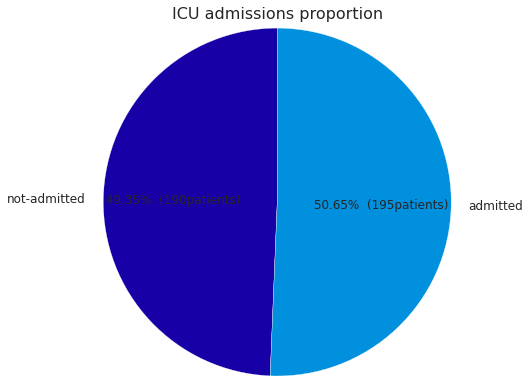

In [32]:
ICU_prop = data[data['WINDOW'] == 'ABOVE_12']
#group by ICU admission
ICU_prop_main = ICU_prop.groupby('ICU')['PATIENT_VISIT_IDENTIFIER'].count().reset_index()

labels = ["not-admitted", "admitted"]
plt.title('ICU admissions proportion', fontdict= {'fontsize' : 16}, pad=75)
plt.pie(ICU_prop_main['PATIENT_VISIT_IDENTIFIER'],textprops={'fontsize': 12},radius =2, labels = labels, startangle=90, autopct=lambda p : '{:.2f}%  ({:,.0f}patients)'.format(p,p * sum(ICU_prop_main['PATIENT_VISIT_IDENTIFIER'])/100))
plt.show()

Note:We can find that 190 patients did not needed ICU out of 385 patients

<!-- ##### We are aware that an ABOVE 12 row for a patient who requires ICU care must be labelled with 1 proportion of patients admitted/not admitted to ICU. -->

In [33]:
df_admitted = (data.groupby("PATIENT_VISIT_IDENTIFIER")["ICU"].sum()>0).reset_index()*1
df_admitted.columns = ["PATIENT_VISIT_IDENTIFIER", "ICU_SUM"]
data_admitted = pd.merge(data, df_admitted, on = "PATIENT_VISIT_IDENTIFIER")

In [34]:
data_admitted.head(10)

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU,ICU_SUM
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

Note:
If you look at PATIENT VISIT IDENTIFIER = 0, you can see that the patient was admitted to the ICU at the ABOVE 12 window, indicating that he finally needed the ICU because his ICU SUM is 1 in each of the five windows. In order to anticipate if any patients ended up in the intensive care unit, this would become the primary aim for our ML models.

---
#### Data drops when the target variable is present.

---

---

** As long as the target variable is present, we can drop rows with ICU == 1 (i.e., drop data when the target variable is present), as instructed by the data author. 

** This is because we cannot use data such as vital signs or anything else when the target variable is present because it is unknown what order the events will occur (maybe the target event happened before the results were obtained). 

** They were maintained there so that we might expand this data in future outcomes.

---

In [35]:
data_ = data_admitted[data_admitted.ICU == 0].reset_index(drop= True)

In [36]:
data_.head(10)

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU,ICU_SUM
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

[link text](https://)### Early Window Data

---

According to the instructions, we should only focus on the early stage ICU data, which means early identification of patients who will develop an unpleasant course of illness (and need intensive care). This is a vital for a proper treatment (saving lives), as well as for managing beds and resources. 

While a predictive model incorporating all time windows will certainly produce more accuracy, a good model using only the first (0-2) is probably more therapeutically useful. 

The data pertaining to the 0–2 windows for ICU admission would then be taken.

---



In [37]:
data_ = data_[data_.WINDOW == "0-2"].reset_index(drop = True)

### Checking data head<a name="CDH"></a>

In [38]:
data_.head(10)

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU,ICU_SUM
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

### Analysis of current **data** <a name="AOCD"></a>

---

We can say that we have reduced our data from 1925 to 353 and we have added only one feature which is ICU_SUM.

---

In [39]:
data_.shape

(353, 232)

---

Check for missing data in the data

---

In [40]:
data_.isna().sum()

PATIENT_VISIT_IDENTIFIER              0
AGE_ABOVE65                           0
AGE_PERCENTIL                         0
GENDER                                0
DISEASE GROUPING 1                    1
DISEASE GROUPING 2                    1
DISEASE GROUPING 3                    1
DISEASE GROUPING 4                    1
DISEASE GROUPING 5                    1
DISEASE GROUPING 6                    1
HTN                                   1
IMMUNOCOMPROMISED                     1
OTHER                                 1
ALBUMIN_MEDIAN                      194
ALBUMIN_MEAN                        194
ALBUMIN_MIN                         194
ALBUMIN_MAX                         194
ALBUMIN_DIFF                        194
BE_ARTERIAL_MEDIAN                  194
BE_ARTERIAL_MEAN                    194
BE_ARTERIAL_MIN                     194
BE_ARTERIAL_MAX                     194
BE_ARTERIAL_DIFF                    194
BE_VENOUS_MEDIAN                    194
BE_VENOUS_MEAN                      194


---

Plotting the bar

---

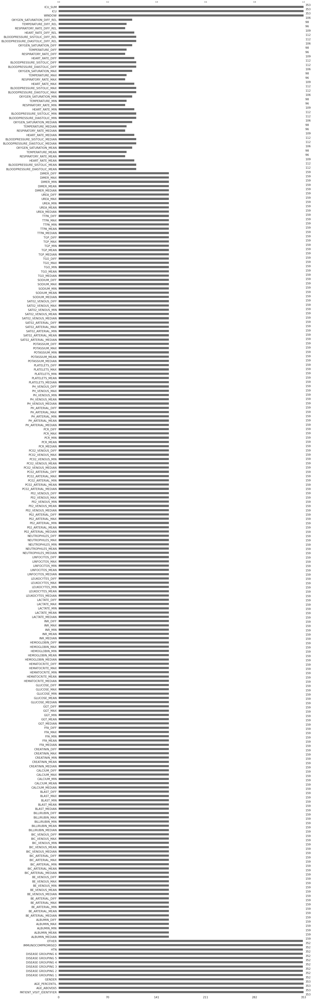

In [41]:
msno.bar(data_);

Observation:

 * It is good that Comorbodis and Demographic features have no null values at all.
 * There are null values for vital signs and Laboratory features. But here is the best news.

It is reasonable to assume that a patient who does not have a measurement recorded in a time window is clinically stable, potentially presenting vital signs and blood labs similar to neighboring windows. Therefore, one may fill the missing values using the next or previous entry.

### Fill missing values <a name="FMV"></a>

---

*Pandas dataframe.bfill() is used to backward fill the missing values in the data. It will backward fill the NaN values that are present in the pandas dataframe.

*Ffill is short for forward filling. In this method, they fill the values that are forward and inserts into it.




---

In [42]:
data_.fillna(method='ffill', inplace = True)
data_.fillna(method='bfill', inplace = True)

---

Let's check the data again

---

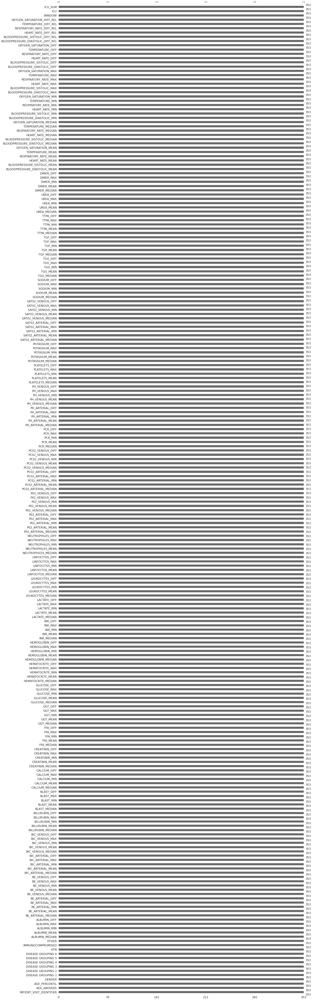

In [43]:
data_.isna().sum()
msno.bar(data_);

---

Drop unnecessary columns that are not needed for data to train

---

In [44]:
clean_data = data_.drop(["PATIENT_VISIT_IDENTIFIER", "WINDOW", "ICU"],axis = 1)
clean_data.shape

(353, 229)

 ---

###### Look for categorical columns and convert them using get_dummies() which is used for data manipulation. It converts categorical data into dummy or indicator variables. So features will be increased

---

In [45]:
cat_columns = clean_data.select_dtypes(object).columns 
print('CAT Columns:'  )
print(cat_columns)
clean_data = pd.get_dummies(clean_data, columns = cat_columns)
print('Total Features: ', len(clean_data.columns.values)) # Features increased 

CAT Columns:
Index(['AGE_PERCENTIL'], dtype='object')
Total Features:  238


---

* Eliminate redundant columns. 
* Columns with identical values. 
* First transpose the columns into the rows, remove any duplicates, and then transpose the columns back into the rows.
---

In [46]:
clean_data= clean_data.reset_index().T.drop_duplicates().T.set_index('index')
print('Total Features after dropping: ', len(clean_data.columns.values)) # Features increased 

Total Features after dropping:  94


In [47]:
clean_data.head(10)

,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_DIFF,BE_VENOUS_MEDIAN,BIC_ARTERIAL_MEDIAN,BIC_VENOUS_MEDIAN,BILLIRUBIN_MEDIAN,BLAST_MEDIAN,CALCIUM_MEDIAN,CREATININ_MEDIAN,FFA_MEDIAN,GGT_MEDIAN,GLUCOSE_MEDIAN,HEMATOCRITE_MEDIAN,HEMOGLOBIN_MEDIAN,INR_MEDIAN,LACTATE_MEDIAN,LEUKOCYTES_MEDIAN,LINFOCITOS_MEDIAN,NEUTROPHILES_MEDIAN,P02_ARTERIAL_MEDIAN,P02_VENOUS_MEDIAN,PC02_ARTERIAL_MEDIAN,PC02_VENOUS_MEDIAN,PCR_MEDIAN,PH_ARTERIAL_MEDIAN,PH_VENOUS_MEDIAN,PLATELETS_MEDIAN,POTASSIUM_MEDIAN,SAT02_ARTERIAL_MEDIAN,SAT02_VENOUS_MEDIAN,SODIUM_MEDIAN,TGO_MEDIAN,TGP_MEDIAN,TTPA_MEDIAN,UREA_MEDIAN,DIMER_MEDIAN,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU_SUM,AGE_PERCENTIL_10th,AGE_PERCENTIL_20th,AGE_PERCENTIL_30th,AGE_PERCENTIL_40th,AGE_PERCENTIL_50th,AGE_PERCENTIL_60th,AGE_PERCENTIL_70th,AGE_PERCENTIL_80th,AGE_PERCENTIL_90th,AGE_PERCENTIL_Above 90th
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.605263,-1.0,-1.0,-0.317073,-0.317073,-0.938950,-1.0,0.357143,-0.912243,-0.742004,-0.958528,-0.780261,0.144654,0.158537,-0.959849,1.000000,-0.382773,-0.908714,-0.412965,-0.170732,-0.704142,-0.77931,-0.754601,-0.939887,0.234043,0.363636,-0.399199,-0.703704,0.939394,0.345679,0.085714,-0.995428,-0.986662,-0.846633,-0.836145,-0.978029,0.086420,-0.230769,-0.283019,-0.593220,-0.285714,0.736842,0.086420,-0.230769,-0.283019,-0.586207,-0.285714,0.736842,0.237113,0.000,-0.162393,-0.500000,0.208791,0.898990,-0.247863,-0.459459,-0.432836,-0.636364,-0.420290,0.736842,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.605263,-1.0,-1.0,-0.317073,-0.317073,-0.938950,-1.0,0.357143,-0.912243,-0.742004,-0.958528,-0.780261,0.144654,0.158537,-0.959849,1.000000,-0.382773,-0.908714,-0.412965,-0.170732,-0.704142,-0.77931,-0.754601,-0.939887,0.234043,0.363636,-0.399199,-0.703704,0.939394,0.345679,0.085714,-0.995428,-0.986662,-0.846633,-0.836145,-0.978029,0.086420,-0.230769,-0.283019,-0.593220,-0.285714,0.736842,0.086420,-0.230769,-0.283019,-0.586207,-0.285714,0.736842,0.237113,0.000,-0.162393,-0.500000,0.208791,0.898990,-0.247863,-0.459459,-0.432836,-0.636364,-0.420290,0.736842,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.605263,-1.0,-1.0,-0.317073,-0.317073,-0.938950,-1.0,0.357143,-0.912243,-0.742004,-0.958528,-0.780261,0.144654,0.158537,-0.959849,1.000000,-0.382773,-0.908714,-0.412965,-0.170732,-0.704142,-0.77931,-0.754601,-0.939887,0.234043,0.363636,-0.399199,-0.703704,0.939394,0.345679,0.085714,-0.995428,-0.986662,-0.846633,-0.836145,-0.978029,0.086420,-0.230769,-0.283019,-0.593220,-0.285714,0.736842,0.086420,-0.230769,-0.283019,-0.586207,-0.285714,0.736842,0.237113,0.000,-0.162393,-0.500000,0.208791,0.898990,-0.247863,-0.459459,-0.432836,-0.636364,-0.420290,0.736842,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.

In [48]:
clean_data.shape

(353, 94)

---

Check for any null values

---

In [49]:
#check for empty  or null cells
np.where(pd.isnull(clean_data))

(array([], dtype=int64), array([], dtype=int64))

#### The amount of rows has been reduced significantly by cleaning the data. Next focus is on removing **few** features.

---

Checking correlations with every feature including target column which is in the ICU_SUM.

---

In [50]:
corr_data = clean_data.corrwith(clean_data["ICU_SUM"])
print(corr_data)

AGE_ABOVE65                         0.292719
GENDER                             -0.115633
DISEASE GROUPING 1                  0.072626
DISEASE GROUPING 2                  0.088044
DISEASE GROUPING 3                  0.123178
DISEASE GROUPING 4                  0.112807
DISEASE GROUPING 5                  0.123032
DISEASE GROUPING 6                 -0.026096
HTN                                 0.181559
IMMUNOCOMPROMISED                   0.072270
OTHER                               0.049401
ALBUMIN_MEDIAN                      0.029169
ALBUMIN_DIFF                             NaN
BE_VENOUS_MEDIAN                    0.009458
BIC_ARTERIAL_MEDIAN                -0.025349
BIC_VENOUS_MEDIAN                  -0.068613
BILLIRUBIN_MEDIAN                  -0.037142
BLAST_MEDIAN                        0.057546
CALCIUM_MEDIAN                     -0.075131
CREATININ_MEDIAN                    0.091000
FFA_MEDIAN                         -0.023922
GGT_MEDIAN                          0.022150
GLUCOSE_ME

In [51]:
corr_data.max()

0.9999999999999999

In [52]:
corr_data.min()

-0.19336388284313574

Note:

* The degree to which two variables move in opposition to one another is characterised by a negative correlation. For instance, when X and Y are the two variables, a rise in X causes a reduction in Y.

* To take the best linked attributes, we shall utilise -0.01 to 0.01.

In [53]:
np_corr_data = np.array(corr_data)
columns = []
for i in np_corr_data:
  if(i):
    if(i>0.01):
      columns.append(True)
    elif(i<-0.01):
      columns.append(True)
    else:
      columns.append(False)
  else:
    columns.append(False)

selection = np.array(columns)
selected_data = clean_data.loc[:, selection]
selected_data.head()
print('Total Final data Rows and Columns: ',selected_data.shape )

Total Final data Rows and Columns:  (353, 83)


In [54]:
selected_data.describe()

,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,BIC_ARTERIAL_MEDIAN,BIC_VENOUS_MEDIAN,BILLIRUBIN_MEDIAN,BLAST_MEDIAN,CALCIUM_MEDIAN,CREATININ_MEDIAN,FFA_MEDIAN,GGT_MEDIAN,HEMATOCRITE_MEDIAN,HEMOGLOBIN_MEDIAN,INR_MEDIAN,LACTATE_MEDIAN,LEUKOCYTES_MEDIAN,LINFOCITOS_MEDIAN,NEUTROPHILES_MEDIAN,P02_ARTERIAL_MEDIAN,P02_VENOUS_MEDIAN,PC02_VENOUS_MEDIAN,PCR_MEDIAN,PH_ARTERIAL_MEDIAN,PLATELETS_MEDIAN,POTASSIUM_MEDIAN,SAT02_ARTERIAL_MEDIAN,SAT02_VENOUS_MEDIAN,SODIUM_MEDIAN,TGO_MEDIAN,TGP_MEDIAN,TTPA_MEDIAN,UREA_MEDIAN,DIMER_MEDIAN,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU_SUM,AGE_PERCENTIL_10th,AGE_PERCENTIL_20th,AGE_PERCENTIL_30th,AGE_PERCENTIL_40th,AGE_PERCENTIL_60th,AGE_PERCENTIL_70th,AGE_PERCENTIL_80th,AGE_PERCENTIL_90th,AGE_PERCENTIL_Above 90th
count,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000
mean,0.456091,0.379603,0.104816,0.022663,0.090652,0.019830,0.127479,0.042493,0.192635,0.161473,0.832861,0.593112,-0.325917,-0.340842,-0.941296,-0.999262,0.329190,-0.899408,-0.714443,-0.933784,-0.085146,-0.114940,-0.945191,0.498631,-0.764259,-0.764025,-0.821269,-0.168901,-0.672226,-0.778133,-0.794857,0.228015,-0.518966,-0.565418,0.935102,0.338195,-0.110590,-0.987125,-0.983836,-0.840500,-0.854493,-0.942576,-0.024237,-0.279298,-0.459804,0.103265,0.734096,-0.022208,-0.279473,-0.456481,0.099150,0.735948,0.137233,-0.043272,-0.366451,0.441459,0.893038,-0.319677,-0.490116,-0.505880,-0.092417,0.745042,-0.988816,-0.992318,-0.983336,-0.982733,-0.990901,-0.990910,-0.992193,-0.986719,-0.982865,-0.982503,-0.990727,0.461756,0.107649,0.118980,0.110482,0.107649,0.084986,0.096317,0.101983,0.079320,0.096317
std,0.498775,0.485977,0.306751,0.149038,0.287521,0.139614,0.333982,0.201997,0.394928,0.368489,0.373629,0.068107,0.059653,0.091341,0.033821,0.013861,0.076112,0.050051,0.196285,0.187257,0.176730,0.187099,0.054181,0.828227,0.113865,0.143934,0.112821,0.045810,0.174365,0.058438,0.233753,0.047300,0.201921,0.168677,0.080643,0.319521,0.207132,0.045659,0.030428,0.042894,0.064994,0.177730,0.255761,0.310950,0.228278,0.297137,0.196023,0.257061,0.310074,0.231872,0.306383,0.197526,0.215926,0.253195,0.240726,0.187969,0.078385,0.177718,0.220125,0.211819,0.233360,0.194364,0.045402,0.038272,0.067221,0.058876,0.028961,0.038631,0.037882,0.064089,0.068767,0.059822,0.030024,0.499243,0.310376,0.324225

## Amount of feature <a name="AOF"></a>
---

Check the amount features to which categories are remaining

---

---

Previous Feature Group total numbers

---

In [55]:
comorb_lst = [i for i in data.columns if "DISEASE" in i]
comorb_lst.extend(["HTN", "IMMUNOCOMPROMISED", "OTHER"])

demo_lst = [i for i in data.columns if "AGE_" in i]
demo_lst.append("GENDER")

vitalSigns_lst = data.iloc[:,193:-2].columns.tolist()

lab_lst = data.iloc[:,13:193].columns.tolist()

print(f"Number of Comorbities features: {len(comorb_lst)}") 
print(f"Number of Demographics features: {len(demo_lst)}") 
print(f"Number of Vital Signs features: {len(vitalSigns_lst)}") 
print(f"Number of Laboratory features: {len(lab_lst)}") 

Number of Comorbities features: 9
Number of Demographics features: 3
Number of Vital Signs features: 36
Number of Laboratory features: 180


--- 

###Present Feature Groups

---

In [56]:
new_comorb_lst = []
new_demo_lst = []
new_vitalSigns_lst= []
new_lab_lst = []

for feature in comorb_lst:
  if feature in selected_data:
    new_comorb_lst.append(feature)

for feature in demo_lst:
  if feature in selected_data:
    new_demo_lst.append(feature)

for feature in vitalSigns_lst:
  if feature in selected_data:
    new_vitalSigns_lst.append(feature)

for feature in lab_lst:
  if feature in selected_data:
    new_lab_lst.append(feature)


print(f"Number of Comorbities features: {len(new_comorb_lst)}") 
print(f"Number of Demographics features: {len(new_demo_lst)}") 
print(f"Number of Vital Signs features: {len(new_vitalSigns_lst)}") 
print(f"Number of Laboratory features: {len(new_lab_lst)}") 

Number of Comorbities features: 9
Number of Demographics features: 2
Number of Vital Signs features: 31
Number of Laboratory features: 31


Note:

There heavily reduced Laboratory Features. 

---

From Pandas Profiling, Disease grouping should be dropped.

---

In [57]:
selected_data.shape

(353, 83)

In [58]:
new_comorb_lst = new_comorb_lst[0:5] # Keeping HTN, IMMUNOCOMPROMISED, OTHER
selected_data = selected_data.drop(new_comorb_lst, axis=1)

In [59]:
selected_data.shape

(353, 78)

---

check if the Target Value is balanced or not

---

In [60]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

y = selected_data['ICU_SUM']

fig = px.histogram(x=y, color=y)
fig.update_layout(bargap=0.5)
fig.show()

Observation

* Yes this is a good balanced

---
Lets take the 4 highest correlated data and then identify the outliers and remedify them.

---

In [61]:
corrWithListPositiveValue = []
corrWithListNegetiveValue = []

highest_correlated_feature = []

for feature in selected_data.columns.values:
  corr_data2 = selected_data[[feature]].corrwith(clean_data["ICU_SUM"])

  if(corr_data2[0] >= 0) :
    corrWithListPositiveValue.append([feature, corr_data2[0]])

  if(corr_data2[0] < 0) :
    corrWithListNegetiveValue.append([feature, corr_data2[0]])

corrWithListPositiveValue = sorted(corrWithListPositiveValue, key=lambda x: x[1], reverse=True)
corrWithListNegetiveValue = sorted(corrWithListNegetiveValue, key=lambda x: x[1], reverse=False)

highest_correlated_feature.append(corrWithListPositiveValue[1][0])
highest_correlated_feature.append(corrWithListPositiveValue[2][0])
highest_correlated_feature.append(corrWithListNegetiveValue[0][0])
highest_correlated_feature.append(corrWithListNegetiveValue[1][0])


highest_correlated_feature

['AGE_ABOVE65',
 'AGE_PERCENTIL_Above 90th',
 'AGE_PERCENTIL_10th',
 'OXYGEN_SATURATION_MIN']

In [62]:
fig = make_subplots(rows=1, cols=1)
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(y=selected_data[highest_correlated_feature[0]], name=highest_correlated_feature[0]),row=1,col=1)
fig.show()

Note: there are no outliers seen.

In [63]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Box(y=selected_data[highest_correlated_feature[1]], name=highest_correlated_feature[1]),row=1,col=1)
fig.show()

#### Outliers detected.

In [64]:
selected_data=selected_data[(selected_data[highest_correlated_feature[1]]>-2)&(selected_data[highest_correlated_feature[1]]<0.5)]
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Box(y=selected_data[highest_correlated_feature[1]], name=highest_correlated_feature[1]),row=1,col=1)
fig.show()

In [65]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Box(y=selected_data[highest_correlated_feature[2]], name=highest_correlated_feature[2]),row=1,col=1)
fig.show()

Outliers detected.




In [66]:
selected_data=selected_data[(selected_data[highest_correlated_feature[2]]>-2)&(selected_data[highest_correlated_feature[2]]<0.5)]
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Box(y=selected_data[highest_correlated_feature[2]], name=highest_correlated_feature[2]),row=1,col=1)
fig.show()

In [67]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Box(y=selected_data[highest_correlated_feature[3]], name=highest_correlated_feature[3]),row=1,col=1)
fig.show()

In [68]:
selected_data=selected_data[(selected_data[highest_correlated_feature[3]]>0.8)&(selected_data[highest_correlated_feature[3]]<1)]
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Box(y=selected_data[highest_correlated_feature[3]], name=highest_correlated_feature[3]),row=1,col=1)
fig.show()

----
Final shape of the data.

---

In [69]:
selected_data.shape

(256, 78)

# ML Model Evaluation <a name="MLB"></a>

### Creating final data of target and features<a name="MLB"></a>

In [70]:
#create x and y data, dropping ICU_SUM in X_data set
X_data = selected_data.drop(['ICU_SUM'], axis = 1)
Y_data = selected_data[['ICU_SUM']]

print(X_data.shape)
print(Y_data.shape)

(256, 77)
(256, 1)


---

train test split, 30% as Test data

---

In [71]:
X_train, X_test, Y_train, Y_test = train_test_split(X_data, Y_data, test_size=0.30, random_state=1)


### Decision Tree classifier.




---

With DecisionTreeClassifier, we have grid Search.

---

In [72]:
tree_param = {'criterion':['gini','entropy'],'max_depth':[4,10,20], 'splitter': ['best', 'random']}
grid_search = GridSearchCV(DecisionTreeClassifier(), tree_param, cv=5)

grid_search.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 10, 20],
                         'splitter': ['best', 'random']})

In [73]:
grid_search.best_params_

{'criterion': 'entropy', 'max_depth': 4, 'splitter': 'random'}

Note:
* Best Parameter for DecisionTreeClassifier is 
   ***{'criterion': 'entropy', 'max_depth': 4, 'splitter': 'random'}***

---

Grid Search with XGBClassifier

---

In [74]:

estimator = XGBClassifier(
    objective= 'binary:logistic',
    nthread=4,
    seed=10,
    n_jobs = -1,
)

parameters = {
    'max_depth': range (2, 5, 1),
    'n_estimators': range(1, 20, 2),
    'learning_rate': [0.1, 0.01, 0.05]
}

grid_search = GridSearchCV(
    estimator=estimator,
    param_grid=parameters,
    scoring = 'roc_auc',
    cv = 5,
    verbose=True
)
grid_search.fit(X_train,np.ravel(Y_train,order='C'))

Fitting 5 folds for each of 90 candidates, totalling 450 fits


GridSearchCV(cv=5, estimator=XGBClassifier(n_jobs=-1, nthread=4, seed=10),
             param_grid={'learning_rate': [0.1, 0.01, 0.05],
                         'max_depth': range(2, 5),
                         'n_estimators': range(1, 20, 2)},
             scoring='roc_auc', verbose=True)

In [75]:
grid_search.best_params_

{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 17}

Note:
Best Parameter for XGBClassifier is 
***{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 17}***

---

Grid Search with LogisticRegression

---

In [76]:
param_values = {'penalty': ['l2'], 'C': [0.001,0.01,0.1,1,10,100,1000]} 


tuned_parameters = {'penalty': ['l2'], 'C': [0.1, 0.5, 1, 5, 10, 50, 100]}
grid_search = GridSearchCV(LogisticRegression(solver='liblinear'), tuned_parameters, cv=3, scoring="accuracy")

grid_search.fit(X_train,np.ravel(Y_train,order='C'))

GridSearchCV(cv=3, estimator=LogisticRegression(solver='liblinear'),
             param_grid={'C': [0.1, 0.5, 1, 5, 10, 50, 100], 'penalty': ['l2']},
             scoring='accuracy')

In [77]:
grid_search.best_params_

{'C': 1, 'penalty': 'l2'}

Observation:
Best Parameter for XGBClassifier is 
**{'C': 1, 'penalty': 'l2'}**

### Setting up three models with best parameters

In [78]:
clfs = {
        "Decision":DecisionTreeClassifier(criterion= 'entropy', max_depth= 4, splitter= 'random'),
        "XGBoost":XGBClassifier(learning_rate = 0.01,max_depth = 3, n_estimators = 17 ), 
        "LogisticRegression":LogisticRegression(C=1, penalty = 'l2'), 
        }

---

All value of the model tree will be solved

---

In [79]:
def model_fit(clfs):
    fitted_model={}
    model_result = pd.DataFrame()
    for model_name, model in clfs.items():
        model.fit(X_train,np.ravel(Y_train,order='C'))
        fitted_model.update({model_name:model})
        y_pred = model.predict(X_test)
        model_dict = {}
        model_dict['1.Algorithm'] = model_name
        model_dict['2.Accuracy'] = round(accuracy_score(np.ravel(Y_test,order='C'), y_pred),3)
        model_dict['3.Precision'] = round(precision_score(np.ravel(Y_test,order='C'), y_pred),3)
        model_dict['4.Recall'] = round(recall_score(np.ravel(Y_test,order='C'), y_pred),3)
        model_dict['5.F1'] = round(f1_score(np.ravel(Y_test,order='C'), y_pred),3)
        model_dict['6.ROC'] = round(roc_auc_score(np.ravel(Y_test,order='C'), y_pred),3)
        model_result = model_result.append(model_dict,ignore_index=True)
    return fitted_model, model_result

In [80]:
fitted_model, model_result = model_fit(clfs)

In [81]:
model_result.sort_values(by=['2.Accuracy'],ascending=False)

,1.Algorithm,2.Accuracy,3.Precision,4.Recall,5.F1,6.ROC
0,Decision,0.571,0.500,0.182,0.267,0.523
1,XGBoost,0.558,0.462,0.182,0.261,0.511
2,LogisticRegression,0.558,0.467,0.212,0.292,0.515


---

Finding out which features played the crucial part

---

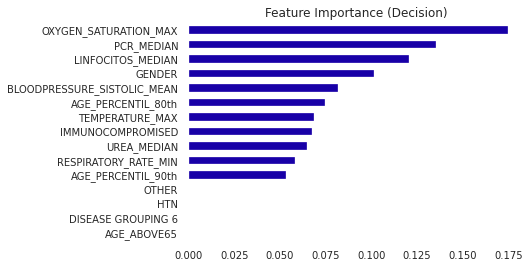

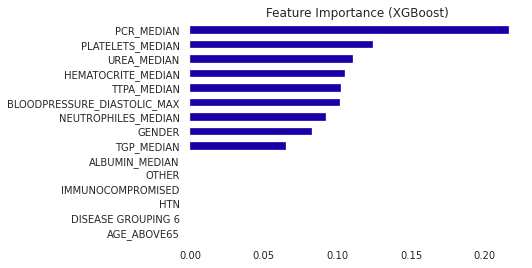

In [82]:
model_name = model_result["1.Algorithm"]
for model in model_name:
    if model == 'LogisticRegression':  # LogisticRegression does not have Feature Importance
      continue 
    feat_imp = pd.Series(fitted_model.get(model).feature_importances_, index=X_data.columns)
    feat_imp = feat_imp.nlargest(15).sort_values()
    feat_imp.plot(kind="barh", title="Feature Importance ({:})".format(model))
    plt.show()

Note:

  Eliminateing the features gender and AGE ABOVE 65 to avoid them to be significant.

### Ensemble Voting

---

By merging different base models to create an ideal and reliable model, assembling is a potent strategy for improving the performance of the model.
Types of Ensembling techniques include:

    Bagging or Bootstrap Aggregation
    Boosting
    Stacking Classifier
    Voting Classifier

The Voting Classifier will be used. A voting classifier is a type of machine learning estimator that develops a number of base models or estimators and makes predictions based on averaging their results. Voting for each estimator output can be integrated with the aggregating criteria.

---

In [83]:
model_result.sort_values(by=['2.Accuracy'],ascending=False)

,1.Algorithm,2.Accuracy,3.Precision,4.Recall,5.F1,6.ROC
0,Decision,0.571,0.500,0.182,0.267,0.523
1,XGBoost,0.558,0.462,0.182,0.261,0.511
2,LogisticRegression,0.558,0.467,0.212,0.292,0.515


---

Let's find the weight models

---

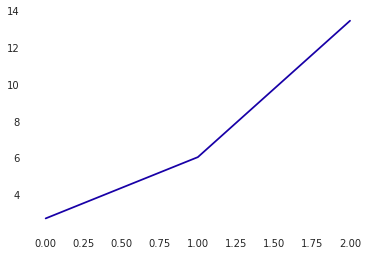

In [84]:
model_ordered = []
weights = []
i=1
for model_name in model_result['1.Algorithm'][
    index_natsorted(model_result['2.Accuracy'], reverse=False)]:
    model_ordered.append([model_name, clfs.get(model_name)])
    weights.append(math.exp(i))
    i+=0.8 

plt.plot(weights)
plt.show()

In [85]:
weights

[2.718281828459045, 6.0496474644129465, 13.463738035001692]

In [86]:
model_ordered

[['XGBoost', XGBClassifier(learning_rate=0.01, n_estimators=17)],
 ['LogisticRegression', LogisticRegression(C=1)],
 ['Decision',
  DecisionTreeClassifier(criterion='entropy', max_depth=4, splitter='random')]]

---

### Creating the VotingClassifier

---

In [87]:
vc = VotingClassifier(estimators=model_ordered, weights=weights)

In [88]:
clfs_new = clfs.copy()
clfs_new.update({"VotingClassifier":vc})
clfs_new

{'Decision': DecisionTreeClassifier(criterion='entropy', max_depth=4, splitter='random'),
 'XGBoost': XGBClassifier(learning_rate=0.01, n_estimators=17),
 'LogisticRegression': LogisticRegression(C=1),
 'VotingClassifier': VotingClassifier(estimators=[['XGBoost',
                               XGBClassifier(learning_rate=0.01,
                                             n_estimators=17)],
                              ['LogisticRegression', LogisticRegression(C=1)],
                              ['Decision',
                               DecisionTreeClassifier(criterion='entropy',
                                                      max_depth=4,
                                                      splitter='random')]],
                  weights=[2.718281828459045, 6.0496474644129465,
                           13.463738035001692])}

In [89]:
fitted_model_new, model_result_new = model_fit(clfs_new)

In [90]:
model_result_new.sort_values(by=['2.Accuracy'],ascending=False)

,1.Algorithm,2.Accuracy,3.Precision,4.Recall,5.F1,6.ROC
0,Decision,0.623,0.559,0.576,0.567,0.617
1,XGBoost,0.558,0.462,0.182,0.261,0.511
2,LogisticRegression,0.558,0.467,0.212,0.292,0.515
3,VotingClassifier,0.506,0.407,0.333,0.367,0.485


Observation:

Our VotingClassifier produces exactly same result of Logistic Regression.

---

So we can come to the conclusion that the LogisticRegression is best suitable Machine learning model for our ICU Prediction.

---

# Conclusion


----

At this step, EDA demonstrates how datasets are handled using all the installed packages that are required to perform the tasks. There are four phases in this notebook, and each stage has its own categories and tasks, which are completed in the appropriate order. 

Installing the necessary data tools comes first, followed by loading the data, loading the analysis, and then presenting every stage of the data processing and EDA processes. The final step was to generate the final data target before setting up three models with the best parameters, ensemble voting, and creating the votingClassifier.

The most crucial component of the project is that we achieve a successful outcome at its conclusion.

----

# End of Workshop